Note: while these packages are not required for the use of MorphLink, they are used
here to demonstrate the functionality of the package with real data and integration
with multiple other packages. This tutorial requires:

- `CAVEclient`,
- `skeletor`,
- `pcg_skel`,
- `pyvista`,

all of which are available on PyPI.


## Initialization

Start a CAVEclient


In [1]:
from caveclient import CAVEclient

client = CAVEclient("minnie65_public")

Create a `MorphLink` instance. This is the object we'll use for keeping track of
different features and representations of morphology.


In [2]:
from morphlink import MorphLink

morphology = MorphLink()

## Adding a mesh


We'll start by getting the morphology of a single neuron as a mesh.


In [3]:
root_id = 864691135361314119

cv = client.info.segmentation_cloudvolume(progress=False)
mesh = cv.mesh.get(
    root_id, deduplicate_chunk_boundaries=False, remove_duplicate_vertices=False
)[root_id]

We can add this to our morphology representation using the `add_mesh` method.


In [4]:
morphology.add_mesh(mesh, "mesh")
morphology.layers

,layer,layer_type
name,,
mesh,"Mesh(vertices=(2652062, 3), faces=(5293626, 3))",Mesh


## Adding point annotations


Next, we can add the nucleus location for this neuron. This is a new type of layer,
in this case just a single point.


In [5]:
nuc_info = client.materialize.query_table(
    "nucleus_detection_v0",
    filter_equal_dict={"pt_root_id": root_id},
    split_positions=True,
    desired_resolution=[1, 1, 1],
)
nuc_loc = nuc_info[["pt_position_x", "pt_position_y", "pt_position_z"]].values.squeeze()
nuc_loc

array([725760., 491456., 853080.])

In [6]:
morphology.add_points(nuc_loc, "nucleus")

In [7]:
morphology.layers

,layer,layer_type
name,,
mesh,"Mesh(vertices=(2652062, 3), faces=(5293626, 3))",Mesh
nucleus,"Points(points=(1, 3))",Points


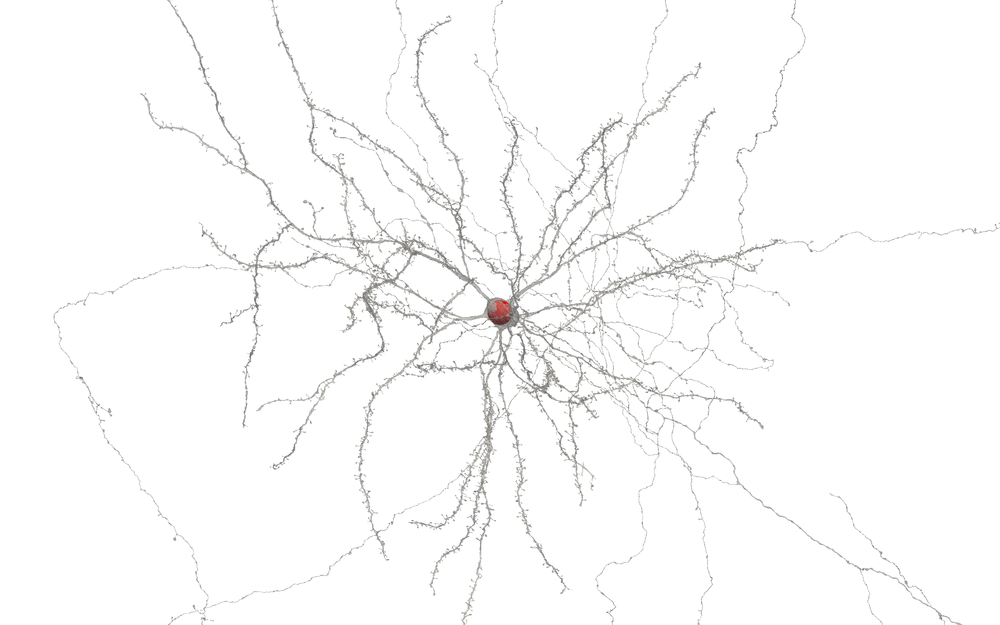

In [8]:
polydatas = morphology.to_pyvista()

import pyvista as pv

WINDOW_SIZE = [2400, 1500]
pv.set_jupyter_backend("static")
plotter = pv.Plotter(window_size=WINDOW_SIZE)
plotter.add_mesh(polydatas["mesh"], color="lightgrey", opacity=0.5)
plotter.add_points(
    polydatas["nucleus"], color="red", point_size=60, render_points_as_spheres=True
)
plotter.camera.focal_point = nuc_loc
plotter.camera.zoom(5)
plotter.show()

Similarly, we can add another layer that consists of many points - in this case,
synapses onto this neuron.


In [9]:
post_synapses = client.materialize.query_table(
    "synapses_pni_2",
    filter_equal_dict={"post_pt_root_id": root_id},
    split_positions=True,
    desired_resolution=[1, 1, 1],
)
post_synapses.set_index("id", inplace=True)

By setting the `spatial_columns` argument, we can specify which columns in the
DataFrame correspond to spatial coordinates. This allows future methods to do
space-aware operations on this layer. In the example above for the nucleus, the
spatial columns were inferred since we passed in a 3-dimensional array.


In [10]:
morphology.add_points(
    post_synapses,
    "post_synapses",
    spatial_columns=["ctr_pt_position_x", "ctr_pt_position_y", "ctr_pt_position_z"],
)

Now, let's link some of these objects together. The simplest mapping is to
annotate the nucleus location on the mesh. Under the hood, the `add_link` method
will find the closest point on the mesh and save that mapping.


In [11]:
morphology.add_link("nucleus", "mesh")

morphology.links

,,link
source,target,
nucleus,mesh,nucleus mesh 0 0 1220064


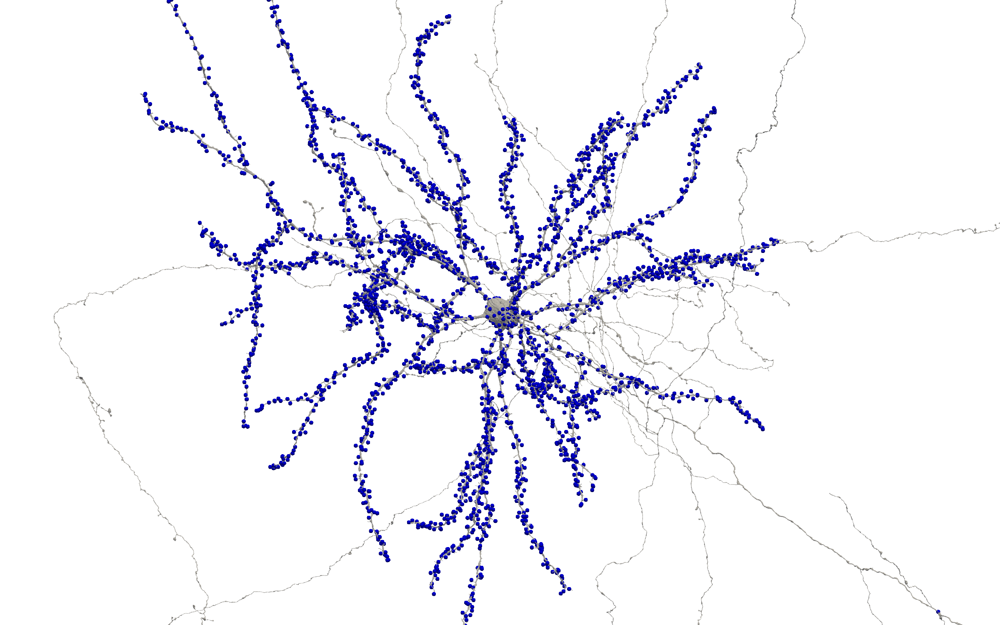

In [12]:
plotter = pv.Plotter(window_size=WINDOW_SIZE)
plotter.add_mesh(polydatas["mesh"], color="lightgrey")
plotter.add_points(
    morphology.post_synapses.to_pyvista(),
    color="blue",
    point_size=10,
    render_points_as_spheres=True,
)
plotter.camera.focal_point = nuc_loc
plotter.camera.zoom(5)
plotter.show()

Again, we can do this for synapses as well, here again finding the closest point on
the mesh for each synapse.


In [13]:
morphology.add_link("post_synapses", "mesh")

morphology.links

,,link
source,target,
nucleus,mesh,nucleus mesh 0 0 1220064
post_synapses,mesh,post_synapses mesh 0 1873158...


We can retreive the mapping between the nucleus and the mesh using the
`get_link` method. This returns a DataFrame with the mapping as its two columns.


In [14]:
morphology.get_link("nucleus", "mesh")

,nucleus,mesh
0,0,1220064


We can also ask for the specific mapping for a point in our nucleus layer. Since we
only have one point in this layer, we just get one item back from the mapping, denoting
the closest point on the mesh.


In [15]:
mesh_nuc_index = morphology.get_mapping("nucleus", "mesh")

mesh_nuc_index

Index([1220064], dtype='int64', name='mesh')

## Adding a skeleton


Now, we can do something a bit more interesting. Let's skeletonize the mesh, using
the nucleus as the source points for the skeletonization.

Note: requires `skeletor` package to be installed.


In [16]:
import time

from skeletor.skeletonize import by_wavefront

currtime = time.time()

out = by_wavefront(mesh, origins=mesh_nuc_index.to_list(), progress=True)
print(f"{time.time() - currtime:.3f} seconds elapsed.")

Skeletonizing:   0%|          | 0/2652062 [00:00<?, ?it/s]

25.010 seconds elapsed.


This skeletonization process stores the mapping between mesh vertices and the new,
collapsed vertices from the skeletonization. First, let's add the skeleton to our
morphology representations.


In [17]:
morphology.add_graph(out, "skeleton")

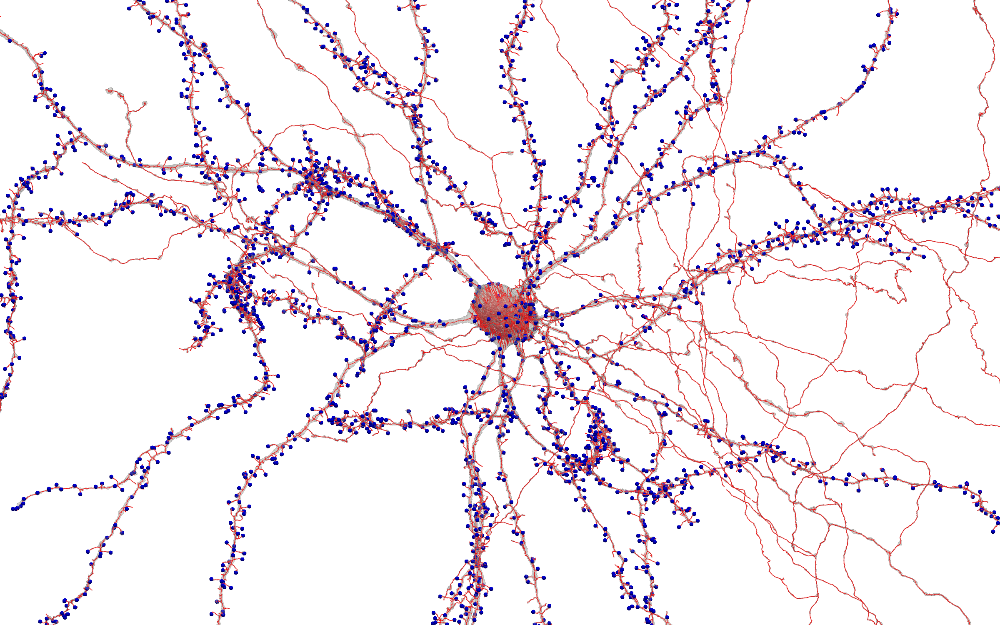

In [18]:
plotter = pv.Plotter(window_size=WINDOW_SIZE)
plotter.add_mesh(morphology.mesh.to_pyvista(), color="lightgrey", opacity=0.3)
plotter.add_mesh(
    morphology.post_synapses.to_pyvista(),
    color="blue",
    point_size=10,
    render_points_as_spheres=True,
)
plotter.add_mesh(morphology.skeleton.to_pyvista(), color="red", line_width=2)
plotter.camera.focal_point = nuc_loc
plotter.camera.zoom(10)
plotter.show()

Then, we can add the mapping between the mesh and the skeleton. This mapping is
stored in the `mesh_map` attribute of the skeletonization output.


In [19]:
morphology.add_link("mesh", "skeleton", mapping=out.mesh_map)

In [20]:
morphology.links

,,link
source,target,
nucleus,mesh,nucleus mesh 0 0 1220064
post_synapses,mesh,post_synapses mesh 0 1873158...
mesh,skeleton,mesh skeleton 0 0 ...


## More complex mappings


Now, we might also be interested in where synapses are located along the skeleton.
Even though the skeletonization map doesn't have a direct mapping between the mesh
and the synapses, we can first map synapses to their points on the mesh, and then
map those mesh points to their points on the skeleton.

Fortunately, this kind of transitive mapping is handled automatically by MorphLink
under the hood. Internally, there is a graph that denotes relationships between
different layers, and the `link_path` method can be used to find the path from a
source layer to a target layer (if one exists).

Many times, this will just be a direct link.


In [21]:
morphology.get_link_path("post_synapses", "mesh")

['post_synapses', 'mesh']

But as in the case of the synapses and the skeleton, it will find the path that
involves mapping synapses to the mesh, and then the mesh to the skeleton.


In [22]:
morphology.get_link_path("post_synapses", "skeleton")

['post_synapses', 'mesh', 'skeleton']

In [23]:
synapse_skeleton_ids = morphology.get_mapping("post_synapses", "skeleton")
synapse_skeleton_ids

Index([124839,  64175, 121215, 115029,  54276,  10115,  46720, 114390, 103022,
        53731,
       ...
       133495,  97907,  48629,  27888,  46546,  67137, 116864, 116624,  71817,
       116485],
      dtype='int64', name='skeleton', length=3216)

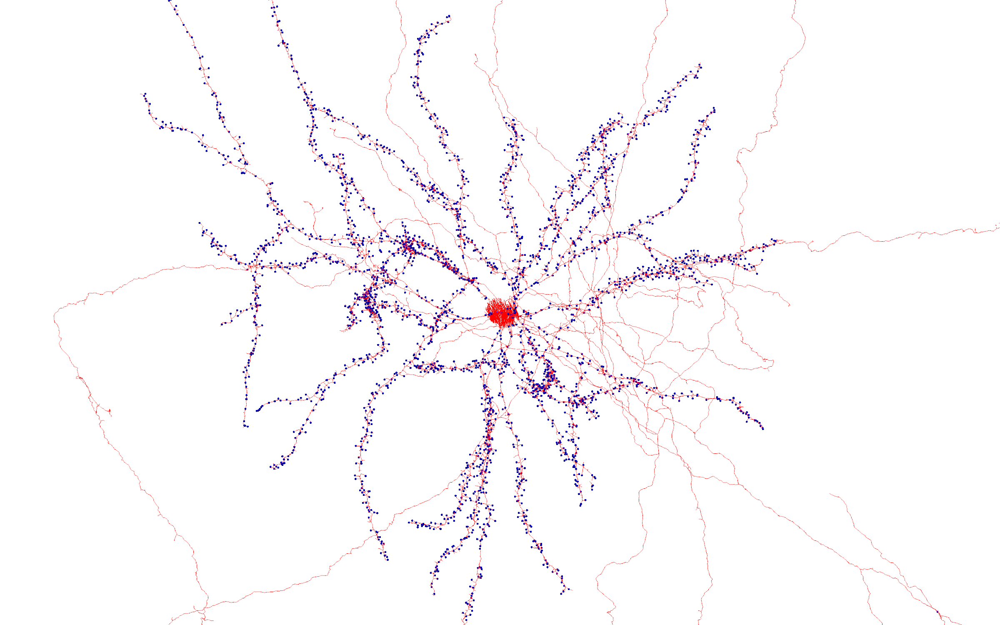

In [24]:
skeleton_synapse_points = morphology.skeleton.nodes.iloc[synapse_skeleton_ids]

plotter = pv.Plotter(window_size=WINDOW_SIZE)
plotter.add_mesh(morphology.skeleton.to_pyvista(), color="red", line_width=1)
plotter.add_points(
    skeleton_synapse_points.values,
    color="blue",
    point_size=5,
    render_points_as_spheres=True,
)
plotter.camera.focal_point = nuc_loc
plotter.camera.zoom(5)
plotter.show()

## Working with a level2 graph


In [25]:
import numpy as np

edgelist = client.chunkedgraph.level2_chunk_graph(root_id)
edgelist = np.array(edgelist)

In [26]:
level2_ids = np.unique(edgelist)

l2_data = client.l2cache.get_l2data(
    level2_ids,
    attributes=["area_nm2", "max_dt_nm", "mean_dt_nm", "size_nm3", "rep_coord_nm"],
)

In [27]:
import pandas as pd

l2_nodes = pd.DataFrame(l2_data).T
l2_nodes.index = l2_nodes.index.astype(int)
l2_nodes["x"] = l2_nodes["rep_coord_nm"].apply(lambda x: x[0])
l2_nodes["y"] = l2_nodes["rep_coord_nm"].apply(lambda x: x[1])
l2_nodes["z"] = l2_nodes["rep_coord_nm"].apply(lambda x: x[2])

In [28]:
morphology.add_graph((l2_nodes, edgelist), "l2_graph", spatial_columns=["x", "y", "z"])
morphology.layers

,layer,layer_type
name,,
mesh,"Mesh(vertices=(2652062, 3), faces=(5293626, 3))",Mesh
nucleus,"Points(points=(1, 3))",Points
post_synapses,"Points(points=(3216, 3))",Points
skeleton,"Graph(nodes=(155446, 3), edges=(154842, 2))",Graph
l2_graph,"Graph(nodes=(11131, 8), edges=(12473, 2))",Graph


Skeletonizing the level2 graph can also provide a quick way to get a skeleton, albeit
at the loss of some spatial resolution.


In [29]:
from pcg_skel import pcg_skeleton_direct

In [30]:
morphology.l2_graph.vertices

array([[485504., 623368., 862520.],
       [484488., 623928., 861720.],
       [487552., 619264., 863640.],
       ...,
       [968952., 670280., 862800.],
       [968976., 671688., 862520.],
       [969088., 672544., 862600.]])

Note that the edges were supplied as named index pairs, not on positional node indices.


In [31]:
morphology.l2_graph.edges

array([[153486945027096730, 153487013746573379],
       [153486945027096730, 153557313771274442],
       [153487013746573379, 153557382490751099],
       ...,
       [170095617920467521, 170165986664644757],
       [170165917945168013, 170165986664644757],
       [170165986664644757, 170166055384121514]])

But `edges_positional` will return the edges with positional node indices.


In [32]:
morphology.l2_graph.edges_positional

array([[    0,     1],
       [    0,     4],
       [    1,     5],
       ...,
       [11127, 11129],
       [11128, 11129],
       [11129, 11130]])

In [33]:
pcg_skeleton = pcg_skeleton_direct(
    morphology.l2_graph.vertices,
    morphology.l2_graph.edges_positional,
    collapse_soma=True,
    root_point=np.squeeze(morphology.nucleus.vertices),
)

100%|██████████| 11130/11130 [00:00<00:00, 57334.56it/s]


In [34]:
morphology.add_graph(pcg_skeleton, "pcg_skeleton")

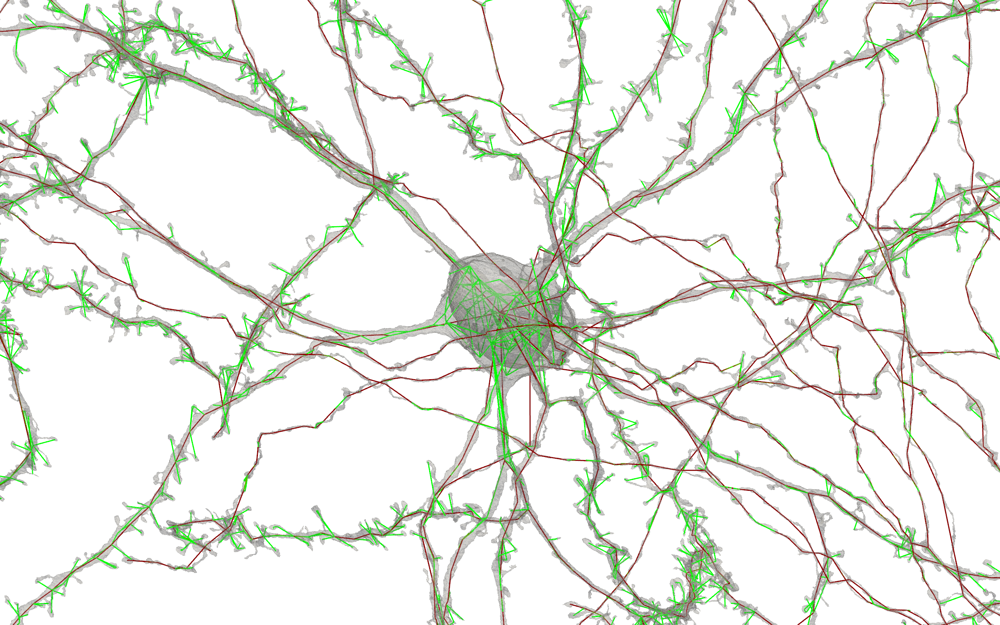

In [35]:
plotter = pv.Plotter(window_size=WINDOW_SIZE)
# pv.set_jupyter_backend('client')
# plotter = pv.Plotter()
plotter.add_mesh(morphology.mesh.to_pyvista(), color="lightgrey", opacity=0.3)
plotter.add_mesh(morphology.l2_graph.to_pyvista(), color="lime", line_width=3)
plotter.add_mesh(morphology.pcg_skeleton.to_pyvista(), color="darkred", line_width=3)

plotter.camera.focal_point = nuc_loc
plotter.camera.zoom(20)
plotter.show()

Again, let's add some links, including the one created by the skeletonization process.
The rest will just be again based on nearest point mappings, for now.


In [36]:
morphology.add_link("l2_graph", "pcg_skeleton", mapping=pcg_skeleton.mesh_to_skel_map)
morphology.add_link("nucleus", "pcg_skeleton", mapping="closest")

# these ones in particular are not perfect and could be refined with CAVEclient calls,
# but let's see how it does
morphology.add_link("mesh", "pcg_skeleton", mapping="closest")
morphology.add_link("l2_graph", "mesh", mapping="closest")

In [37]:
morphology.links

,,link
source,target,
nucleus,mesh,nucleus mesh 0 0 1220064
post_synapses,mesh,post_synapses mesh 0 1873158...
mesh,skeleton,mesh skeleton 0 0 ...
l2_graph,pcg_skeleton,l2_graph pcg_skeleton 0 ...
nucleus,pcg_skeleton,nucleus pcg_skeleton 0 0 5535
mesh,pcg_skeleton,mesh pcg_skeleton 0 ...
l2_graph,mesh,l2_graph mesh 0 1534...


## Masking and filtering


A common operation one might want to do on a neuron is to mask out the axon, or extract
just the axon, etc. `morphlink` aims to be agnostic to _how_ you want to compute something
like "where is the axon on this neuron", and is only here to help you keep track of how
that labeling implicitly applies to other parts of a morphology.

As a concrete example, computing this kind of split of axon/dendrite can be done using
the skeleton and its synapses.


In [86]:
pre_synapses = client.materialize.query_table(
    "synapses_pni_2",
    filter_equal_dict={"pre_pt_root_id": root_id},
    split_positions=True,
    desired_resolution=[1, 1, 1],
)
pre_synapses = pre_synapses.query("pre_pt_root_id != post_pt_root_id")
pre_synapses.set_index("id", inplace=True)

morphology.add_points(
    pre_synapses,
    "pre_synapses",
    spatial_columns=["ctr_pt_position_x", "ctr_pt_position_y", "ctr_pt_position_z"],
)

In [87]:
morphology.add_link("pre_synapses", "mesh")

In [88]:
morphology.links

,,link
source,target,
nucleus,mesh,nucleus mesh 0 0 1220064
post_synapses,mesh,post_synapses mesh 0 1873158...
mesh,skeleton,mesh skeleton 0 0 ...
l2_graph,pcg_skeleton,l2_graph pcg_skeleton 0 ...
nucleus,pcg_skeleton,nucleus pcg_skeleton 0 0 5535
mesh,pcg_skeleton,mesh pcg_skeleton 0 ...
l2_graph,mesh,l2_graph mesh 0 1534...
pre_synapses,mesh,pre_synapses mesh 0 221097100 ...


In [89]:
morphology.get_mapping("post_synapses", "pcg_skeleton")

Index([4277, 5535, 4105, 4047, 1973,  501, 1654, 3932, 3586, 1904,
       ...
       4559, 3299, 1752, 1073, 1664, 2292, 4041, 4093, 2532, 4034],
      dtype='int64', name='pcg_skeleton', length=3216)

In [90]:
morphology.get_mapping("pre_synapses", "pcg_skeleton")

Index([5216, 3623, 2283,  377, 1480, 5475,  421, 4343, 5395, 4625,
       ...
        578, 4340, 1179,  553, 3149, 4246,  103, 4228, 4341, 4789],
      dtype='int64', name='pcg_skeleton', length=657)

In [93]:
from scipy.sparse.linalg import eigsh
from scipy.sparse import diags_array

adj = morphology.pcg_skeleton.to_adjacency()
adj = adj + adj.T
degrees = adj.sum(axis=0)
degree_matrix = diags_array([degrees], offsets=[0], shape=adj.shape)
laplacian = degree_matrix - adj

eigvals, eigvecs = eigsh(laplacian, k=5, sigma=-1e-12)

In [94]:
post_inds = morphology.get_mapping("post_synapses", "pcg_skeleton")
pre_inds = morphology.get_mapping("pre_synapses", "pcg_skeleton")

X_post = eigvecs[post_inds]
X_pre = eigvecs[pre_inds]

y_post = np.zeros(len(post_inds))
y_pre = np.ones(len(pre_inds))

X = np.concatenate([X_post, X_pre])
y = np.concatenate([y_post, y_pre])

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

cols = np.arange(1, eigvecs.shape[1])
lda = LinearDiscriminantAnalysis()
lda.fit(X[:, cols], y)

pred_labels = lda.predict(eigvecs[:, cols])

In [95]:
morphology.pcg_skeleton.nodes["pred_labels"] = pred_labels

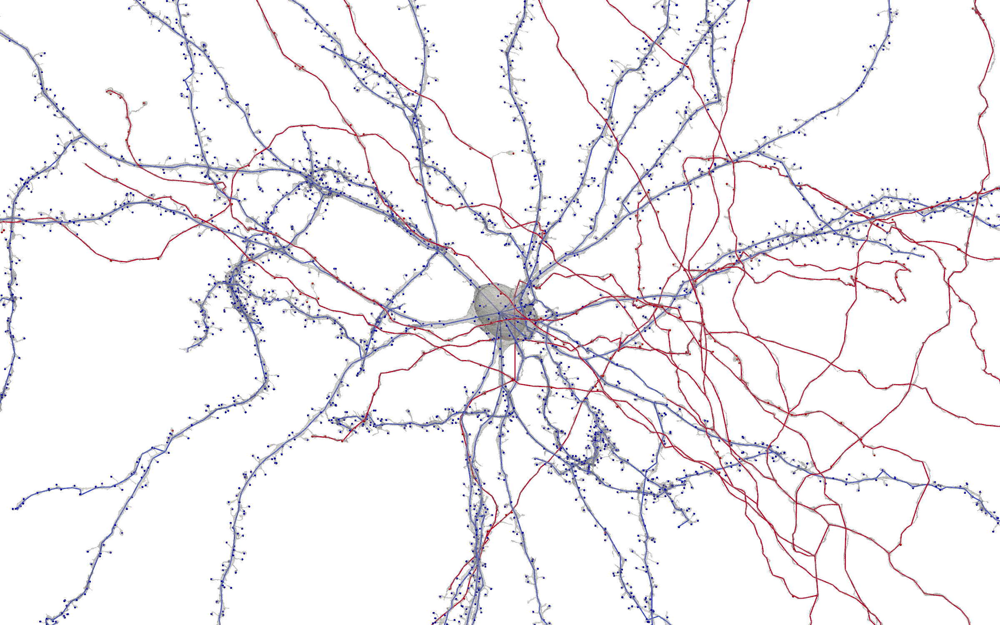

In [105]:
plotter = pv.Plotter(window_size=WINDOW_SIZE)
plotter.add_mesh(morphology.mesh.to_pyvista(), color="lightgrey", opacity=0.3)
plotter.add_mesh(
    morphology.pcg_skeleton.to_pyvista(),
    color="darkred",
    scalars=pred_labels,
    cmap="coolwarm",
    line_width=3,
    show_scalar_bar=False,
)
plotter.add_points(
    morphology.post_synapses.to_pyvista(),
    color="blue",
    point_size=5,
    render_points_as_spheres=True,
)
plotter.add_points(
    morphology.pre_synapses.to_pyvista(),
    color="red",
    point_size=5,
    render_points_as_spheres=True,
)
plotter.camera.focal_point = nuc_loc
plotter.camera.zoom(10)
plotter.show()

Now, the more interesting part: independent of whatever algorithm we chose for doing this split for us,
let's see how to mask the rest of the neuron based on this split.
